# Coronal 2 Striatum IF Alignment

Very helpful tutorial, but for Xenium native H&E images (a little outdated)
https://github.com/quentinblampey/spatialdata_xenium_explorer/blob/master/docs/10x_tutorials/xenium/xenium_tuto.ipynb

In [1]:
import spatialdata as sd
import spatialdata.transformations as sdtrans
import spatialdata_plot
import spatialdata_io as sdio
import tifffile as tif
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import seaborn as sns

## Create SpatialData Object

In [ ]:
# Create a spatialdata object
sdata = sd.read_zarr("/mnt/d/synapse/data/sdata/coronal2.zarr")
sdata

/home/ckmah/mambaforge/envs/synapse/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


SpatialData object, with associated Zarr store: /mnt/d/synapse/data/sdata/coronal2.zarr
├── Images
│     └── 'morphology_focus': DataTree[cyx] (5, 23975, 36993), (5, 11987, 18496), (5, 5993, 9248), (5, 2996, 4624), (5, 1498, 2312)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (23975, 36993), (11987, 18496), (5993, 9248), (2996, 4624), (1498, 2312)
│     └── 'nucleus_labels': DataTree[yx] (23975, 36993), (11987, 18496), (5993, 9248), (2996, 4624), (1498, 2312)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 13) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (81375, 1) (2D shapes)
│     ├── 'cell_circles': GeoDataFrame shape: (81375, 2) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (80099, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (81375, 5006)
with coordinate systems:
    ▸ 'global', with elements:
        morphology_focus (Images), cell_labels (Labels), nucleus_labels (Labels), transcripts (Points), cell_bou

## Align Images

### Components:
- Use spatialdata-io xenium_aligned_image to align DAPI, Presynaptic IF, and Postsynaptic IF cropped images to the coronal 1 cortex image.
- Add aligned images to spatialdata object.
- DAPI and IF cropped images where created using Leica Application Suite X.
- Matrix CSV is a direct output from Xenium Explorer's alignment tool.

### Plots:
- Full tissue DAPI stain plus IF cropped aligned images.

In [ ]:
# Define paths
channel0 = "/mnt/d/synapse/data/aligned_images/coronal2_striatum_aligned/0040870 Section 2_Region 1_Merged_Crop001_ch00.tif"
channel1 = "/mnt/d/synapse/data/aligned_images/coronal2_striatum_aligned/0040870 Section 2_Region 1_Merged_Crop001_ch01.tif"
channel2 = "/mnt/d/synapse/data/aligned_images/coronal2_striatum_aligned/0040870 Section 2_Region 1_Merged_Crop001_ch02.tif"
matrix = "/mnt/d/synapse/data/aligned_images/coronal2_striatum_aligned/0040870-section2-cropped-striatum_channel0.ome_alignment_files/matrix.csv"

In [ ]:
# Align DAPI, presynaptic IF, and postsynaptic IF images
dapi_align = sdio.xenium_aligned_image(
    channel0,
    matrix,
    dims=("c", "y", "x"),
)

pre_align = sdio.xenium_aligned_image(
    channel1,
    matrix,
    dims=("c", "y", "x"),
)

post_align = sdio.xenium_aligned_image(
    channel2,
    matrix,
    dims=("c", "y", "x"),
)

# Add aligned images to spatialdata object
dapi_if = sd.models.Image2DModel.parse(dapi_align)
pre_if = sd.models.Image2DModel.parse(pre_align)
post_if = sd.models.Image2DModel.parse(post_align)

sdata.images["dapi_if"] = dapi_if
sdata.images["pre_if"] = pre_if
sdata.images["post_if"] = post_if

INFO     `dims` is specified redundantly: found also inside `data`.                                                
INFO     `dims` is specified redundantly: found also inside `data`.                                                
INFO     `dims` is specified redundantly: found also inside `data`.                                                


INFO     Rasterizing image for faster rendering.                                                                   
INFO     Rasterizing image for faster rendering.                                                                   


(0.0, 36993.0, 23975.0, 0.0)

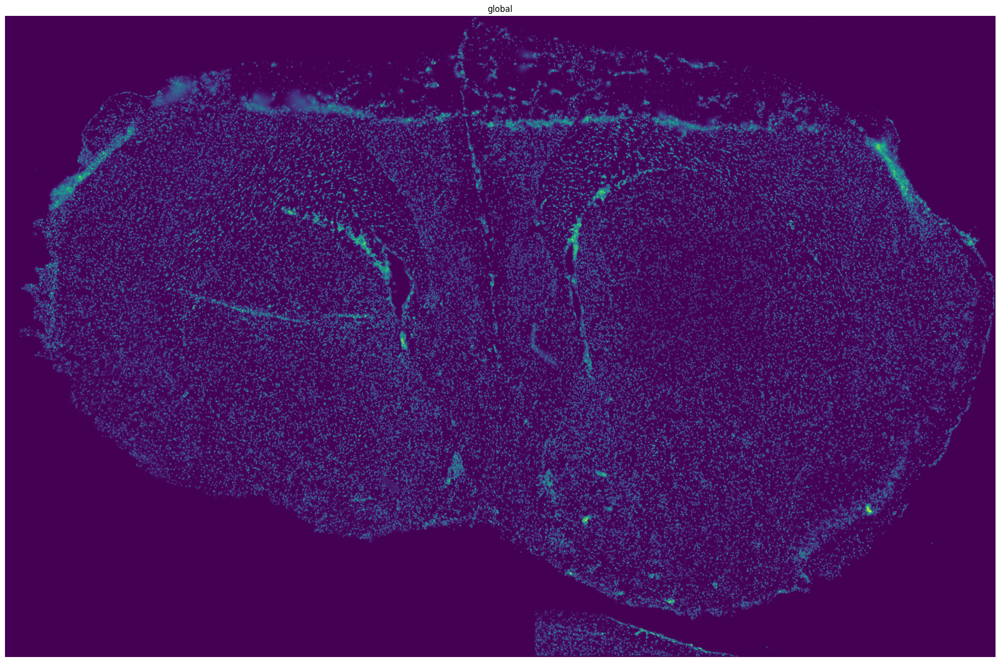

In [ ]:
# Visualize aligned images
sdata.pl.render_images("morphology_focus", channel="DAPI", scale="3").pl.render_images(
    "dapi_if", alpha=0.5, scale="3"
).pl.show(colorbar=False, figsize=(20, 20))
plt.axis("off")

## Get bounds of ROIs and Crop SpatialData Object

### Components:
- Use spatialdata get_extent function to get bounds of the cropped IF images.
- Use spatialdata bounding_box_query function to crop the spatialdata object to the bounds of the IF images.

### Plots:
- Overlaid DAPI images from Xenium experiment and IF to visualize the alignment quality.
- Overlaid nucleus boundaries and DAPI image from the Xenium Experiment to visualize the nucelus boundaries segmentation quality.
- Overlaid nucleus boundaries from the Xenium experiment and DAPI image from IF to visualize the alignment of IF to nucleus boundaries.

In [ ]:
bbox = sd.get_extent(sdata["dapi_if"]) # Get bounding box
extent = [[bbox["x"][0], bbox["y"][0]], [bbox["x"][1], bbox["y"][1]]]

# Crop spatialdata object to bounding box
sdata_cropped = sd.bounding_box_query(
    sdata,
    axes=("x", "y"),
    min_coordinate=extent[0],
    max_coordinate=extent[1],
    target_coordinate_system="global",
)
sdata_cropped

SpatialData object
├── Images
│     ├── 'dapi_if': DataArray[cyx] (1, 11990, 11692)
│     ├── 'morphology_focus': DataTree[cyx] (5, 4947, 5072), (5, 2474, 2536), (5, 1237, 1268), (5, 618, 634), (5, 310, 317)
│     ├── 'post_if': DataArray[cyx] (1, 11990, 11692)
│     └── 'pre_if': DataArray[cyx] (1, 11990, 11692)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (4947, 5072), (2474, 2536), (1237, 1268), (618, 634), (310, 317)
│     └── 'nucleus_labels': DataTree[yx] (4947, 5072), (2474, 2536), (1237, 1268), (618, 634), (310, 317)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 13) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (3131, 1) (2D shapes)
│     ├── 'cell_circles': GeoDataFrame shape: (3065, 2) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (3077, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (3065, 5006)
with coordinate systems:
    ▸ 'global', with elements:
        dapi_if (Images), morphology_focus (Imag

INFO     Rasterizing image for faster rendering.                                                                   
INFO     Rasterizing image for faster rendering.                                                                   


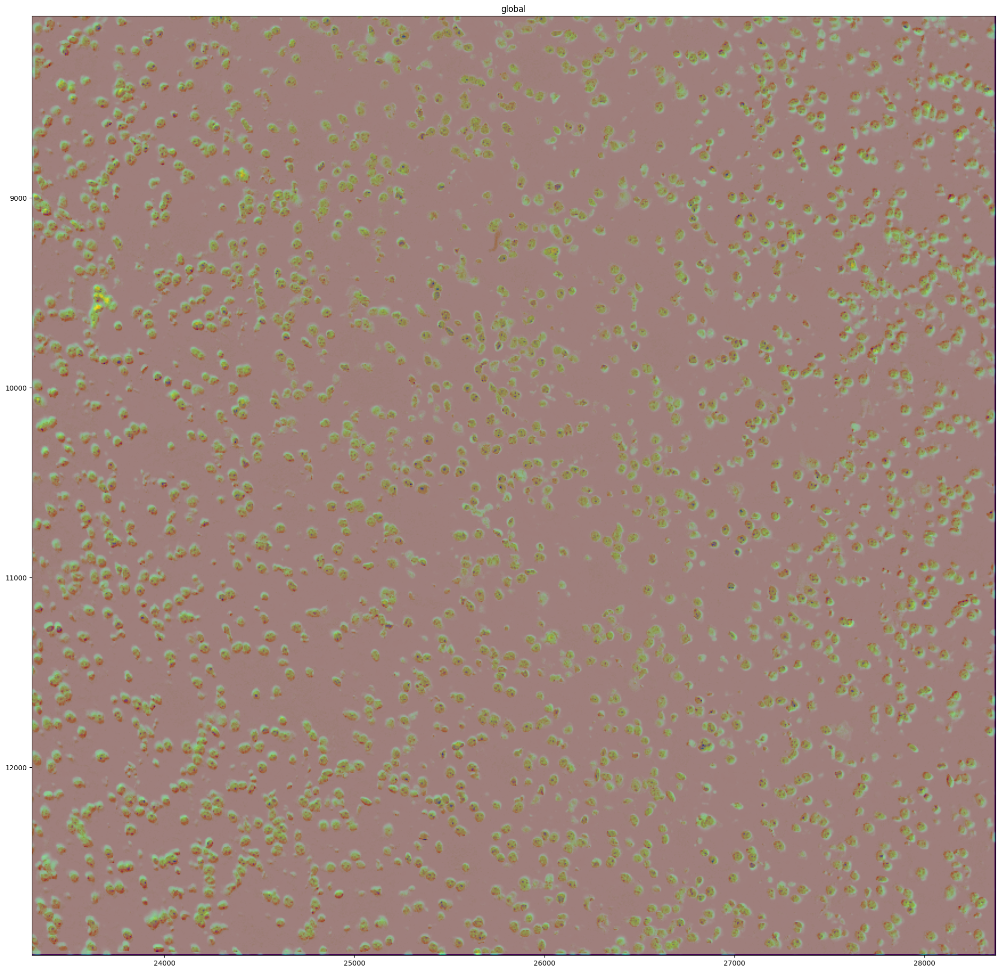

In [7]:
sdata_cropped.pl.render_images(
    "morphology_focus", channel="DAPI", scale="3"
).pl.render_images("dapi_if", alpha=0.5, scale="3", cmap="inferno_r").pl.show(
    colorbar=False, figsize=(20, 20)
)

INFO     Rasterizing image for faster rendering.                                                                   


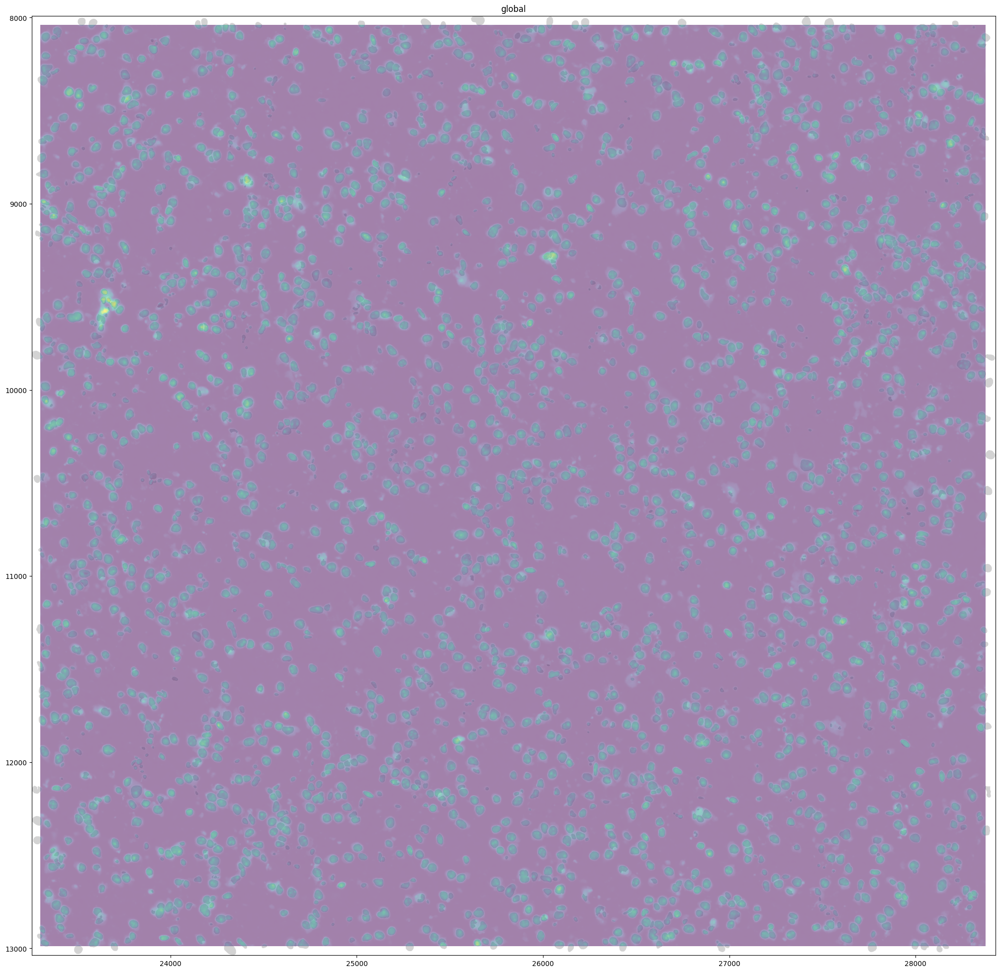

In [8]:
sdata_cropped.pl.render_shapes("nucleus_boundaries").pl.render_images(
    "morphology_focus", channel="DAPI", scale="3", alpha=0.5
).pl.show(colorbar=False, figsize=(20, 20))

INFO     Rasterizing image for faster rendering.                                                                   


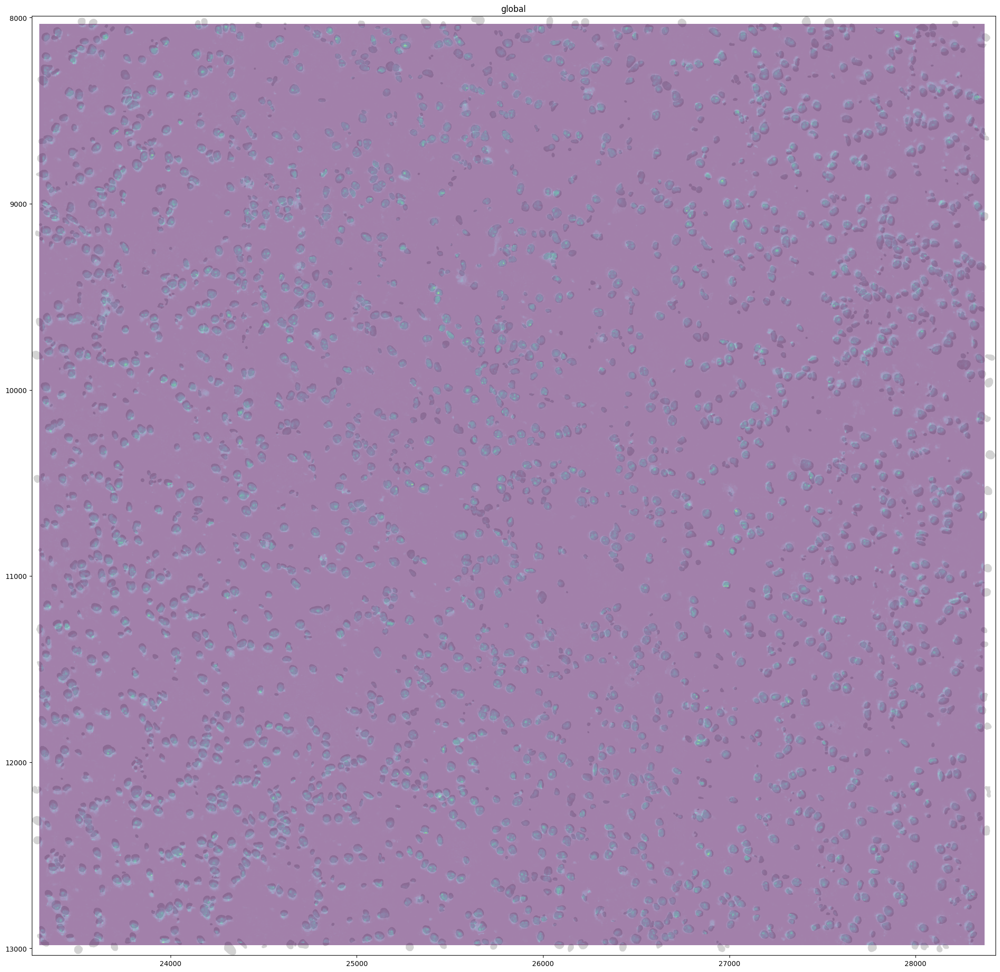

In [9]:
sdata_cropped.pl.render_shapes("nucleus_boundaries").pl.render_images(
    "dapi_if", channel="DAPI", scale="3", alpha=0.5
).pl.show(colorbar=False, figsize=(20, 20))

## Saving

In [ ]:
sdata_cropped.write("/mnt/d/synapse/data/sdata_aligned/coronal2_striatum.zarr")

INFO     The SpatialData object is not self-contained (i.e. it contains some elements that are Dask-backed from    
         locations outside /mnt/d/synapse/data/sdata_if/coronal2_striatum.zarr). Please see the documentation of   
         `is_self_contained()` to understand the implications of working with SpatialData objects that are not     
         self-contained.                                                                                           
INFO     The Zarr backing store has been changed from None the new file path:                                      
         /mnt/d/synapse/data/sdata_if/coronal2_striatum.zarr                                                       
